In [7]:
import pandas as pd
from pathlib import Path
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
from matplotlib.font_manager import FontProperties
import numpy as np
import re
import seaborn as sns


In [8]:


grandparent_dir = Path('/pat/to/granddir')

temps = range(300, 350+1, 50) # T = 300, T = 325, T = 350, T = 375 
nts   = range(20,  30+1,  10) # start: 20, stop: 31 (exclusive), step: 10
cohs  = range(15,  25+1,   5)
nafls = range( 3,  11+1,   4)

D = ("2.7nm", "4.0nm")
############################################################################
wats03_nt20 = [222,] + list(range(300, 400+1, 100))   
wats07_nt20 = [222,] + list(range(300, 700+1, 100))          # = (222, 300, 400, 500, 600, 700)
wats11_nt20 = [222,] + list(range(400, 800+1, 100))

wats03_nt30 = [500,] + list(range(600,   700+1, 100))
wats07_nt30 = [500,] + list(range(800,  1200+1, 100))
wats11_nt30 = [500,] + list(range(1300, 1700+1, 100))

# parent_dirs = list[f"COHCH_gra_t{i}" for i in temps)         # = ('COHCH_gra_t300', 'COHCH_gra_t325', 'COHCH_gra_t350', 'COHCH_gra_t375')
############################################################################

for temp in temps:
    parent_dir = str(f"COHCH_gra_t{temp}")
    print(f"T={temp}")
    
    for nt in nts:
        # print(f"T={temp} & nt={nt}")
        # print("")

        for nafl in nafls:
            match (nafl, nt):
                case (3,  20):
                    wats = wats03_nt20 
                case (7,  20):
                    wats = wats07_nt20 
                case (11, 20):
                    wats = wats11_nt20 
                case (3,  30):
                    wats = wats03_nt30 
                case (7,  30):
                    wats = wats07_nt30 
                case (11, 30):
                    wats = wats11_nt30 

            for coh in cohs:
                for wat in wats:
                    child_dir  = f"nt{nt}-coh{coh}-nafl{nafl}-t{temp}-wat{wat}"
                    child_dir_path = Path(grandparent_dir/parent_dir/child_dir/"output_analysis")
                    
                    count_Ow_above_tube_path = Path(child_dir_path/"above_tube"/"count_Ow.dat")
                    count_Oh_above_tube_path = Path(child_dir_path/"above_tube"/"count_Oh.dat")
                    count_Ow_in_tube_path    = Path(child_dir_path/"in_tube"/"count_Ow.dat")
                    count_Oh_in_tube_path    = Path(child_dir_path/"in_tube"/"count_Oh.dat") 
                    
                    # print(f"file {count_Ow_above_tube_path} exits? {count_Ow_above_tube_path.exists()}")
                    # print(f"file {count_Oh_above_tube_path} exits? {count_Oh_above_tube_path.exists()}")
                    # print(f"file {count_Ow_in_tube_path}    exits? {count_Ow_in_tube_path.exists()}")
                    # print(f"file {count_Oh_in_tube_path}    exits? {count_Oh_in_tube_path.exists()}")
                    # print("")

                    if count_Ow_above_tube_path.exists() == False:
                        continue
                    if count_Oh_above_tube_path.exists() == False:
                        continue
                    if count_Ow_in_tube_path.exists()    == False:
                        continue
                    if count_Oh_in_tube_path.exists()    == False:
                        continue
        
    #     print("===============================================================================================")
    # print("")
    # print("===============================================================================================")
    # print("===============================================================================================")                


T=300
T=350


In [9]:
DataFrame_dict_Ow_above_tube = {}
DataFrame_dict_Oh_above_tube = {}
DataFrame_dict_Ow_in_tube = {}
DataFrame_dict_Oh_in_tube = {} 

dicts_list = [ DataFrame_dict_Ow_above_tube, 
               DataFrame_dict_Oh_above_tube, 
               DataFrame_dict_Ow_in_tube, 
               DataFrame_dict_Oh_in_tube,]

######################################
for temp in temps:
    parent_dir = str(f"COHCH_gra_t{temp}")

    for nt in nts:
        for nafl in nafls:
            match (nafl, nt):
                case (3, 20):
                    wats = wats03_nt20 
                case (7, 20):
                    wats = wats07_nt20 
                case (11, 20):
                    wats = wats11_nt20 
                case (3, 30):
                    wats = wats03_nt30 
                case (7, 30):
                    wats = wats07_nt30 
                case (11, 30):
                    wats = wats11_nt30
            
            for coh in cohs:
                match (temp, nafl, nt, coh):
                    case(350, 7, 20, 15):
                        wats = wats.copy()
                        wats.append(550)
                        wats.append(800)
                        wats.sort()

                    case(300, 7, 30, 15):
                        wats = wats.copy()
                        wats.append(1300)
                        wats.sort()
                    
                    case(300, 7, 30, 15):
                        wats = wats.copy()
                        wats.append(1400)
                        wats.sort()


                    case(300, 7, 20, 20):
                        wats = wats.copy()
                        wats.append(450)
                        wats.sort()

                    case(350, 11, 20, 15):
                        wats = wats.copy()
                        wats.append(1000)
                        wats.sort()

                    case(350, 7, 20, 20):
                        wats = wats.copy()
                        wats.append(800)
                        wats.sort()

                    case(350, 11, 20, 20):
                        wats = wats.copy()
                        wats.append(1000)
                        wats.sort()

                    case(350, 7, 20, 25):
                        wats = wats.copy()
                        wats.append(800)
                        wats.sort()

                    case(350, 11, 20, 25):
                        wats = wats.copy()
                        wats.append(1000)
                        wats.sort()

                    case(350, 7, 30, 15):
                        wats = wats.copy()
                        wats.append(1300)
                        wats.sort()

                    case(350, 11, 30, 15):
                        wats = wats.copy()
                        wats.append(2000)
                        wats.sort()

                    case(350, 11, 30, 20):
                        wats = wats.copy()
                        wats.append(2300)
                        wats.sort()

                    case(350, 11, 30, 25):
                        wats = wats.copy()
                        wats.append(2300)
                        wats.sort()

                    case(300, 11, 30, 20):
                        wats = wats.copy()
                        wats.append(2000)
                        wats.sort()

                for wat in wats:
                    child_dir  = f"nt{nt}-coh{coh}-nafl{nafl}-t{temp}-wat{wat}"
                    child_dir_path = Path(grandparent_dir/parent_dir/child_dir)
##################################################################
                    # if Path(child_dir_path/"restart_system.5000000").exists() == False:
                    #     print(f"{child_dir_path}  \t: calc. NOT completed")
##################################################################                    
                    grandchild_dir_path = Path(grandparent_dir/parent_dir/child_dir/"output_analysis")

                    count_Ow_above_tube_path = Path(grandchild_dir_path/"above_tube"/"count_Ow.dat")
                    count_Oh_above_tube_path = Path(grandchild_dir_path/"above_tube"/"count_Oh.dat")
                    
                    count_Ow_in_tube_path    = Path(grandchild_dir_path/"in_tube"/"count_Ow.dat")
                    count_Oh_in_tube_path    = Path(grandchild_dir_path/"in_tube"/"count_Oh.dat") 
                    
                    paths_tuple = (count_Ow_above_tube_path, 
                                   count_Oh_above_tube_path, 
                                   count_Ow_in_tube_path, 
                                   count_Oh_in_tube_path,)


                    count_Ow_above_tube_key = f"df_Ow_nt{nt}_coh{coh}_nafl{nafl}_t{temp}_wat{wat}"
                    count_Oh_above_tube_key = f"df_Ow_nt{nt}_coh{coh}_nafl{nafl}_t{temp}_wat{wat}"
                    count_Ow_in_tube_key    = f"df_Ow_nt{nt}_coh{coh}_nafl{nafl}_t{temp}_wat{wat}"
                    count_Oh_in_tube_key    = f"df_Ow_nt{nt}_coh{coh}_nafl{nafl}_t{temp}_wat{wat}"
                        
                    keys_tuple = (count_Ow_above_tube_key, 
                                  count_Oh_above_tube_key, 
                                  count_Ow_in_tube_key, 
                                  count_Oh_in_tube_key,)
                    

                    for p in range(2,3+1,1):
                        
                        if paths_tuple[p].exists():
                            match p:
                                case 2 | 3:
                                    dicts_list[p][keys_tuple[p]] = pd.read_csv(paths_tuple[p], delim_whitespace=True, skiprows=4)
                                    dicts_list[p][keys_tuple[p]] = dicts_list[p][keys_tuple[p]].dropna(axis=1)
                            
                            if not dicts_list[p][keys_tuple[p]].empty:
                                dicts_list[p][keys_tuple[p]].rename(columns={dicts_list[p][keys_tuple[p]].columns[0]: 'time (ns)'}, inplace=True)
                            
                            if len(dicts_list[p][keys_tuple[p]].columns) > 1:
                                match p:
                                    case 2:
                                        dicts_list[p][keys_tuple[p]].\
                                            rename(columns={dicts_list[p][keys_tuple[p]].columns[1]: 'number (water molecules)'}, inplace=True)
                                    case 3:
                                        dicts_list[p][keys_tuple[p]].\
                                            rename(columns={dicts_list[p][keys_tuple[p]].columns[1]: 'number (oxonium ions)'}, inplace=True)
                                        
                        else:
                            match p:
                                case 2:
                                    dicts_list[p][keys_tuple[p]] = pd.DataFrame(columns=['time (ns)', 'number (water molecules)'])
                                case 3:
                                    dicts_list[p][keys_tuple[p]] = pd.DataFrame(columns=['time (ns)', 'number (oxonium ions)'])

                    for p in range(0,1+1,1):
                        
                        if paths_tuple[p].exists():
                            match p:
                                case 0 | 1:
                                    dicts_list[p][keys_tuple[p]] = pd.read_csv(paths_tuple[p], delim_whitespace=True, skiprows=4)
                                    dicts_list[p][keys_tuple[p]] = dicts_list[p][keys_tuple[p]].dropna(axis=1)
                            
                            if not dicts_list[p][keys_tuple[p]].empty:
                                dicts_list[p][keys_tuple[p]].rename(columns={dicts_list[p][keys_tuple[p]].columns[0]: 'time (ns)'}, inplace=True)
                            
                            if len(dicts_list[p][keys_tuple[p]].columns) > 1:
                                match p:
                                    case 0:
                                        dicts_list[p][keys_tuple[p]].\
                                            rename(columns={dicts_list[p][keys_tuple[p]].columns[1]: 'number (water molecules)'}, inplace=True)
                                    case 1:
                                        dicts_list[p][keys_tuple[p]].\
                                            rename(columns={dicts_list[p][keys_tuple[p]].columns[1]: 'number (oxonium ions)'}, inplace=True)
                                        

                        # if paths_tuple[p+2].exists():
                            # dicts_list[p][keys_tuple[p]] = dicts_list[p+2][keys_tuple[p+2]].copy()
                            
                            # match p:
                            #     case 0:
                            #         dicts_list[p][keys_tuple[p]].iloc[:,1] = ((( nafl - 1 ) * 250 ) + wat ) - dicts_list[p][keys_tuple[p]].iloc[:,1]
                            #     case 1:
                            #         dicts_list[p][keys_tuple[p]].iloc[:,1] = 250 - dicts_list[p][keys_tuple[p]].iloc[:,1]
                                        
                        else:
                            match p:
                                case 0:
                                    dicts_list[p][keys_tuple[p]] = pd.DataFrame(columns=['time (ns)', 'number (water molecules)'])
                                case 1:
                                    dicts_list[p][keys_tuple[p]] = pd.DataFrame(columns=['time (ns)', 'number (oxonium ions)'])



<< T=300; diameter=2.7nm, coh=30, λ = 3 >>
1


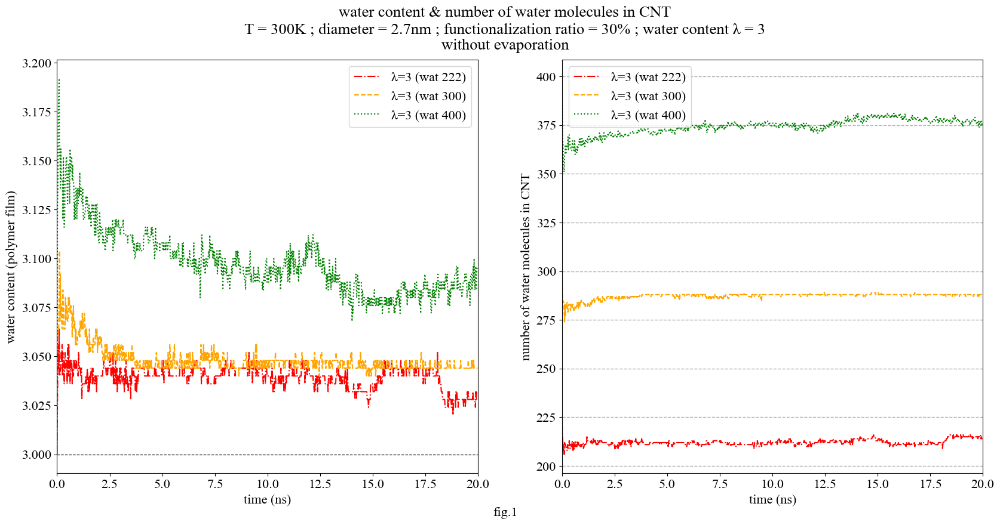

<< T=300; diameter=2.7nm, coh=30, λ = 7 >>
2


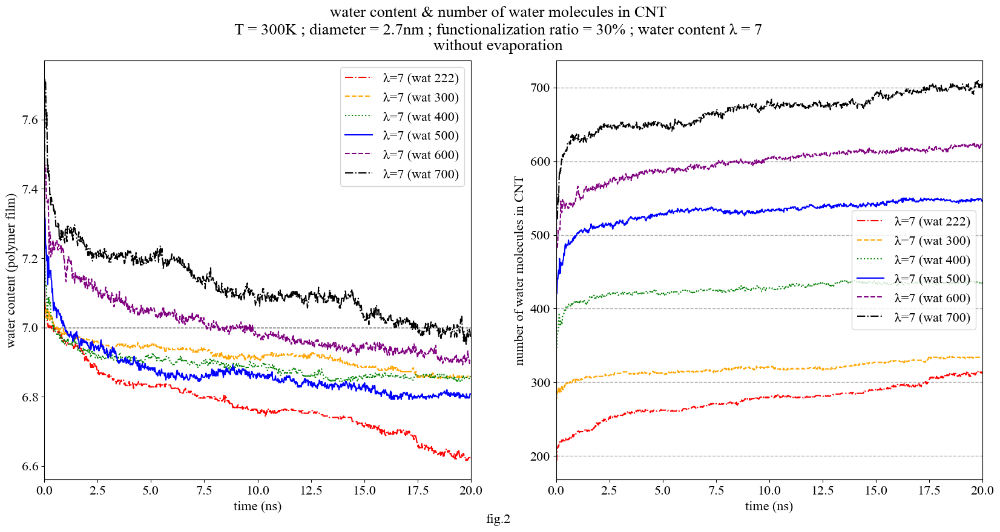

<< T=300; diameter=2.7nm, coh=30, λ = 11 >>
3


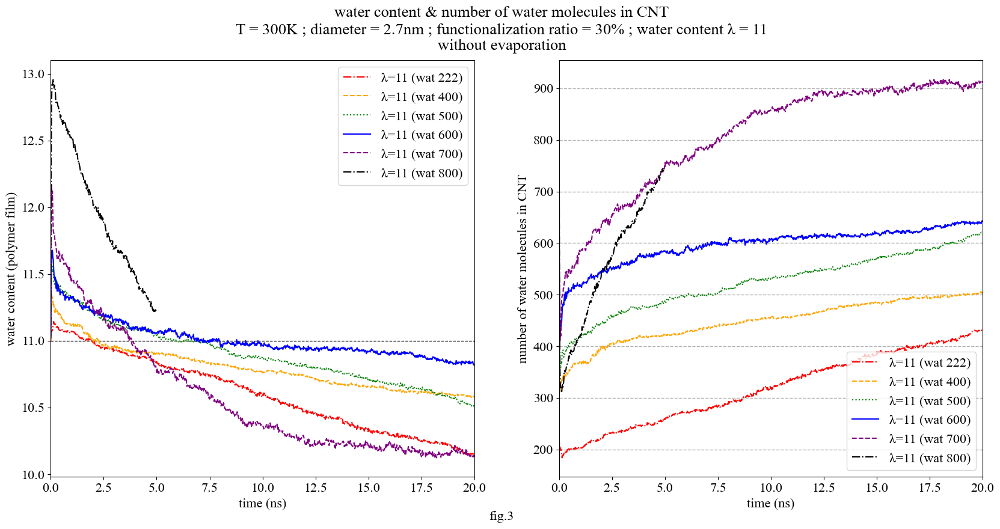

<< T=300; diameter=2.7nm, coh=40, λ = 3 >>
4


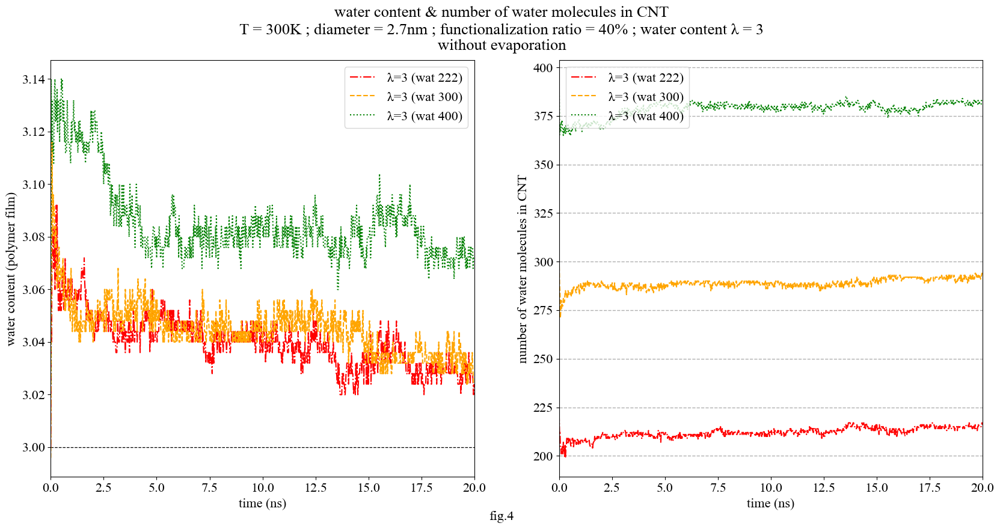

<< T=300; diameter=2.7nm, coh=40, λ = 7 >>
Key Error with df_Ow_nt20_coh20_nafl7_t300_wat450 [number (water molecules above)]: Empty DataFrame

df_Ow_nt20_coh20_nafl3_t300_wat450 [number (oxonium ions above)]: Empty DataFrame
df_Ow_nt20_coh20_nafl7_t300_wat450 [number (water molecules in CNT)]: Empty DataFrame
5


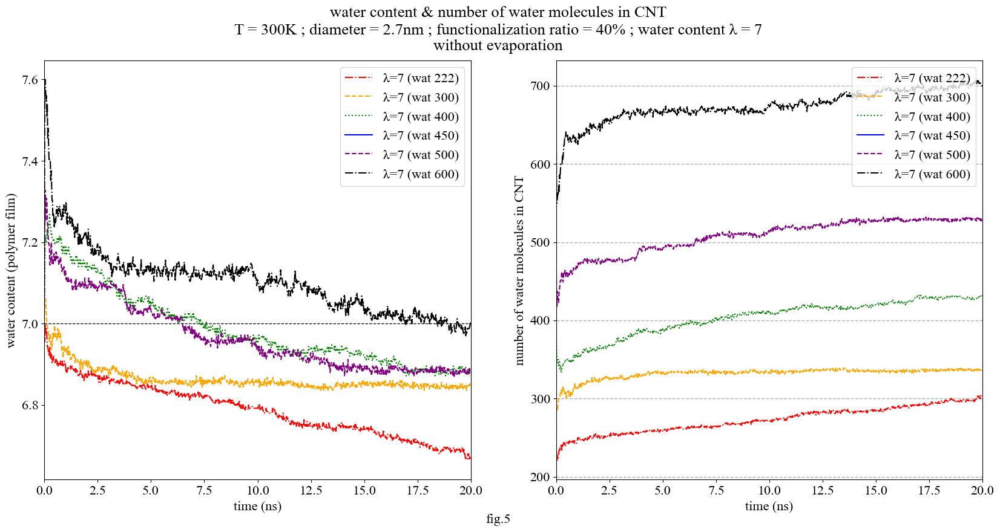

<< T=300; diameter=2.7nm, coh=40, λ = 11 >>
6


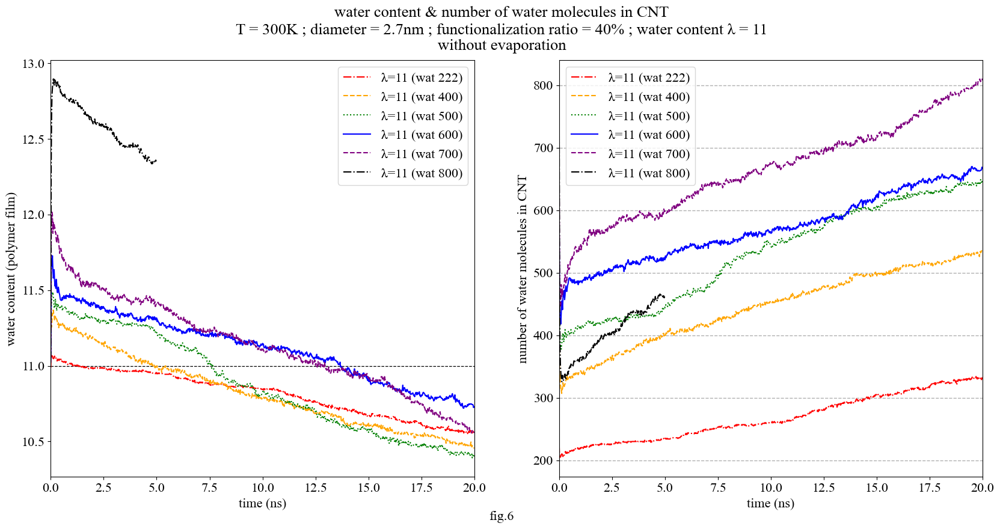

<< T=300; diameter=2.7nm, coh=50, λ = 3 >>
7


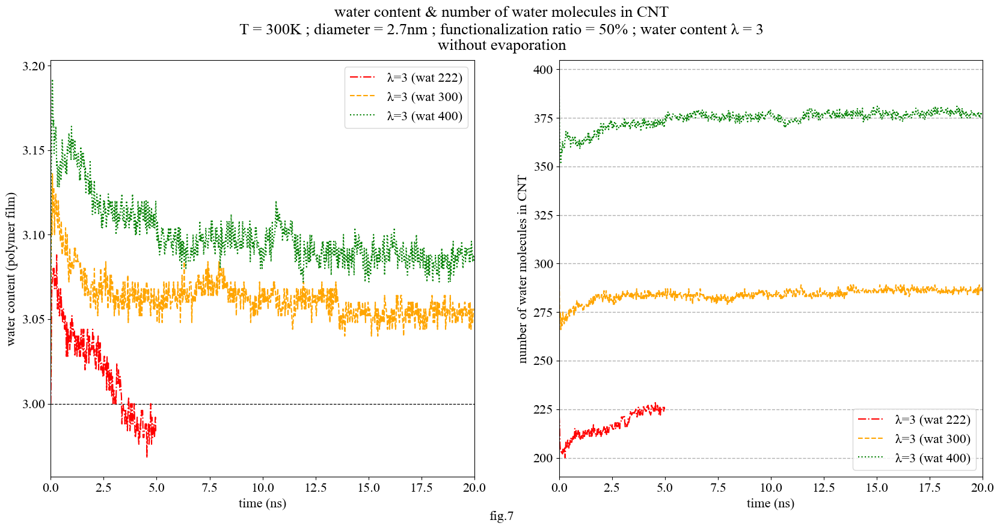

<< T=300; diameter=2.7nm, coh=50, λ = 7 >>
8


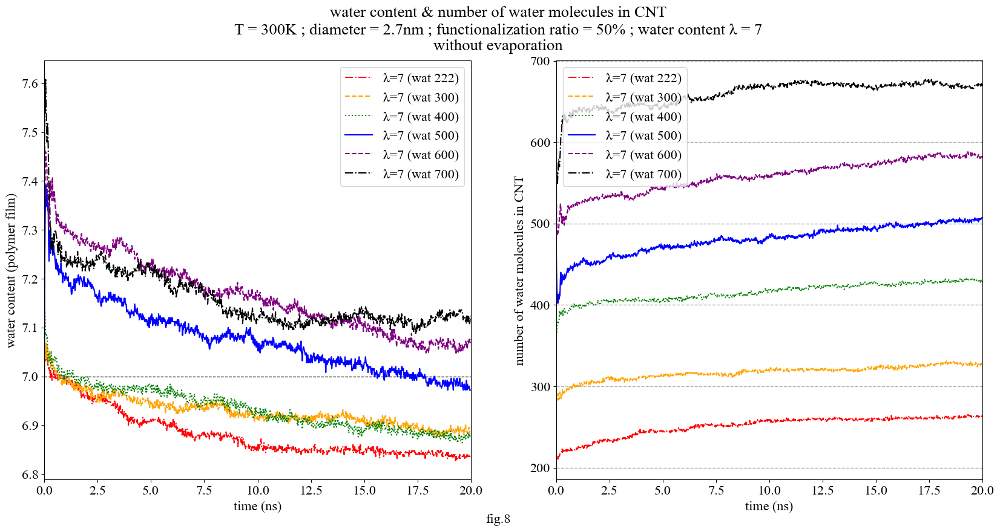

<< T=300; diameter=2.7nm, coh=50, λ = 11 >>
9


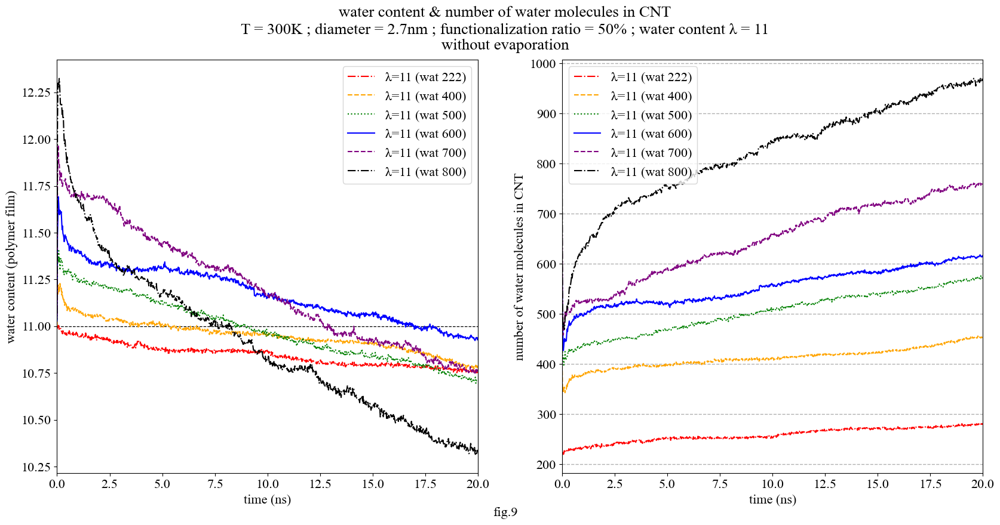

<< T=300; diameter=4.0nm, coh=30, λ = 3 >>
df_Ow_nt30_coh15_nafl7_t300_wat600 [number (oxonium ions above)]: Empty DataFrame
df_Ow_nt30_coh15_nafl3_t300_wat600 [number (water molecules in CNT)]: Empty DataFrame
df_Ow_nt30_coh15_nafl7_t300_wat700 [number (oxonium ions above)]: Empty DataFrame
df_Ow_nt30_coh15_nafl3_t300_wat700 [number (water molecules in CNT)]: Empty DataFrame
10


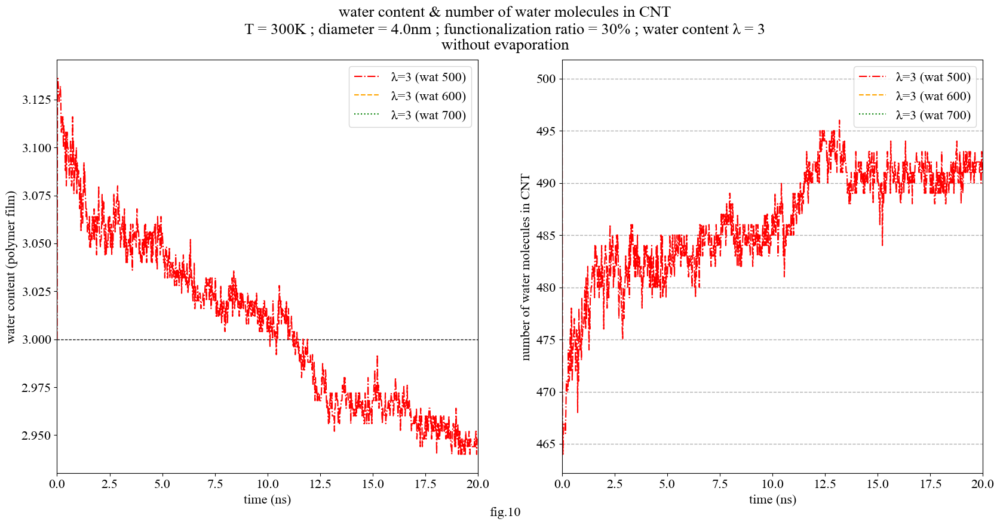

<< T=300; diameter=4.0nm, coh=30, λ = 7 >>
Key Error with df_Ow_nt30_coh15_nafl7_t300_wat1300 [number (water molecules above)]: Empty DataFrame

df_Ow_nt30_coh15_nafl7_t300_wat1300 [number (oxonium ions above)]: Empty DataFrame
df_Ow_nt30_coh15_nafl7_t300_wat1300 [number (water molecules in CNT)]: Empty DataFrame
11


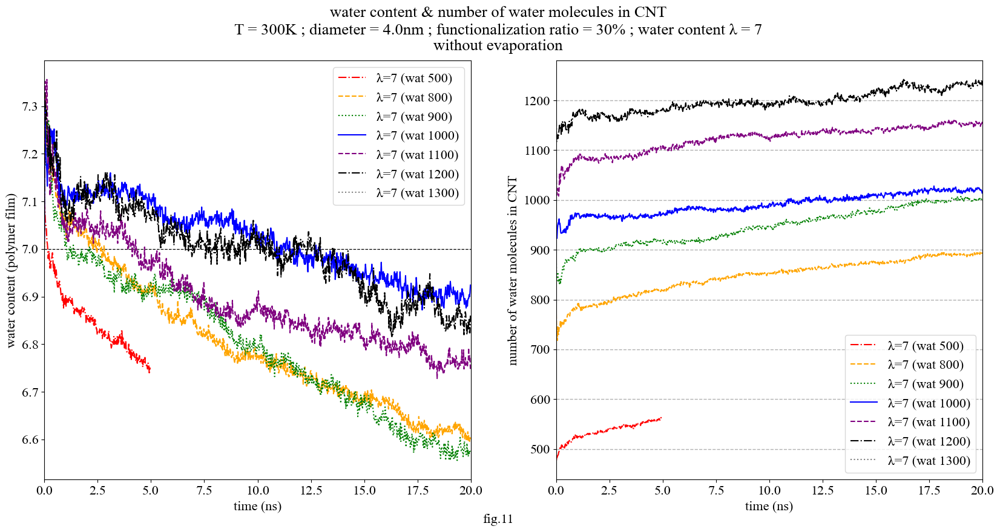

<< T=300; diameter=4.0nm, coh=30, λ = 11 >>
12


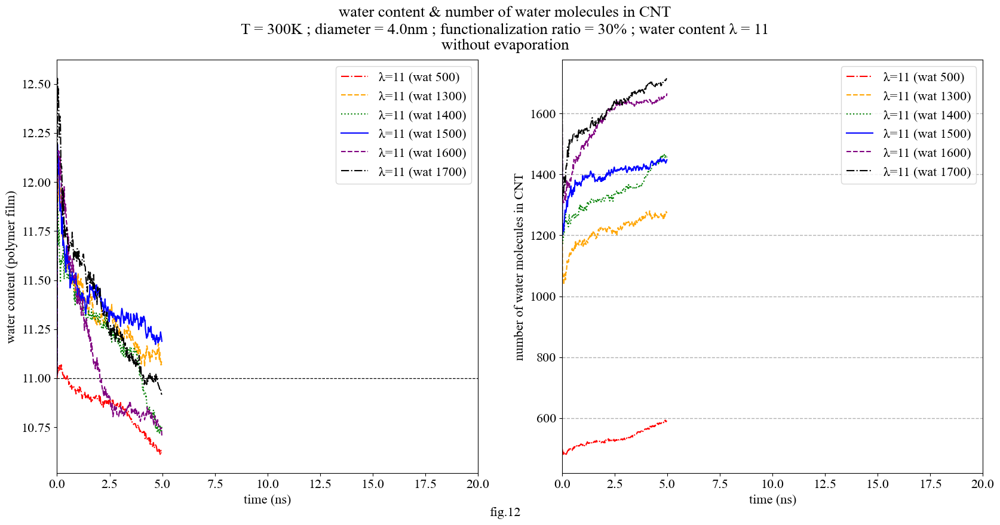

<< T=300; diameter=4.0nm, coh=40, λ = 3 >>
Key Error with df_Ow_nt30_coh20_nafl3_t300_wat600 [number (water molecules above)]: Empty DataFrame

df_Ow_nt30_coh20_nafl7_t300_wat600 [number (oxonium ions above)]: Empty DataFrame
df_Ow_nt30_coh20_nafl3_t300_wat600 [number (water molecules in CNT)]: Empty DataFrame
Key Error with df_Ow_nt30_coh20_nafl3_t300_wat700 [number (water molecules above)]: Empty DataFrame

df_Ow_nt30_coh20_nafl7_t300_wat700 [number (oxonium ions above)]: Empty DataFrame
df_Ow_nt30_coh20_nafl3_t300_wat700 [number (water molecules in CNT)]: Empty DataFrame
13


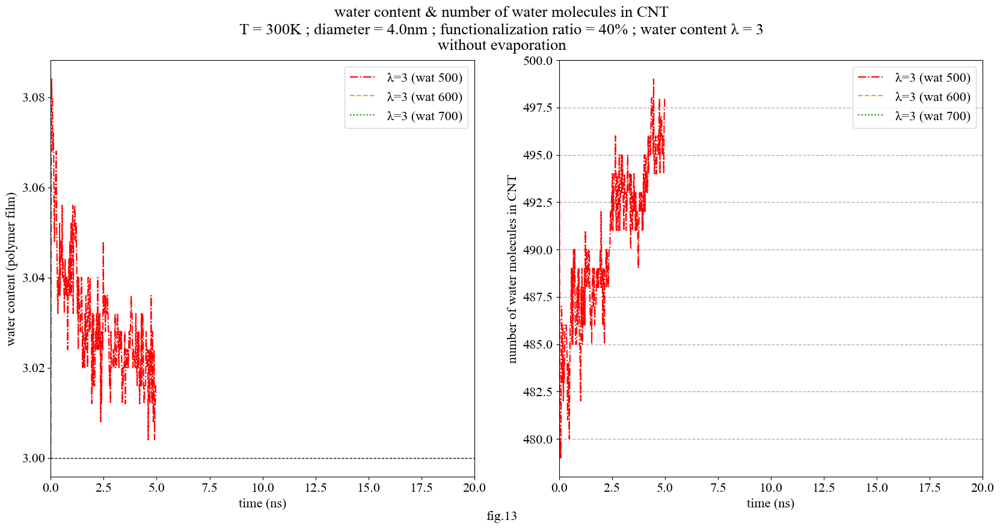

<< T=300; diameter=4.0nm, coh=40, λ = 7 >>
14


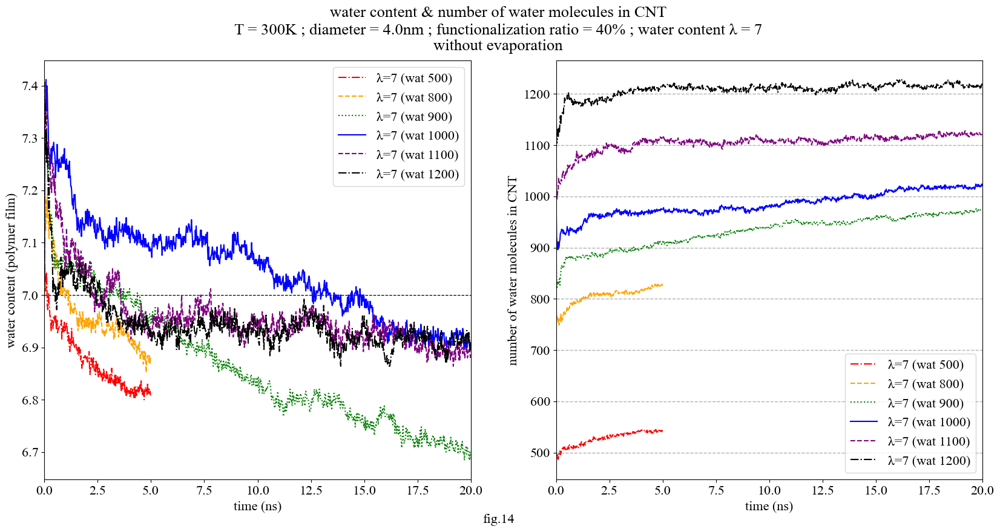

<< T=300; diameter=4.0nm, coh=40, λ = 11 >>
Key Error with df_Ow_nt30_coh20_nafl11_t300_wat2000 [number (water molecules above)]: Empty DataFrame

df_Ow_nt30_coh20_nafl7_t300_wat2000 [number (oxonium ions above)]: Empty DataFrame
df_Ow_nt30_coh20_nafl11_t300_wat2000 [number (water molecules in CNT)]: Empty DataFrame
15


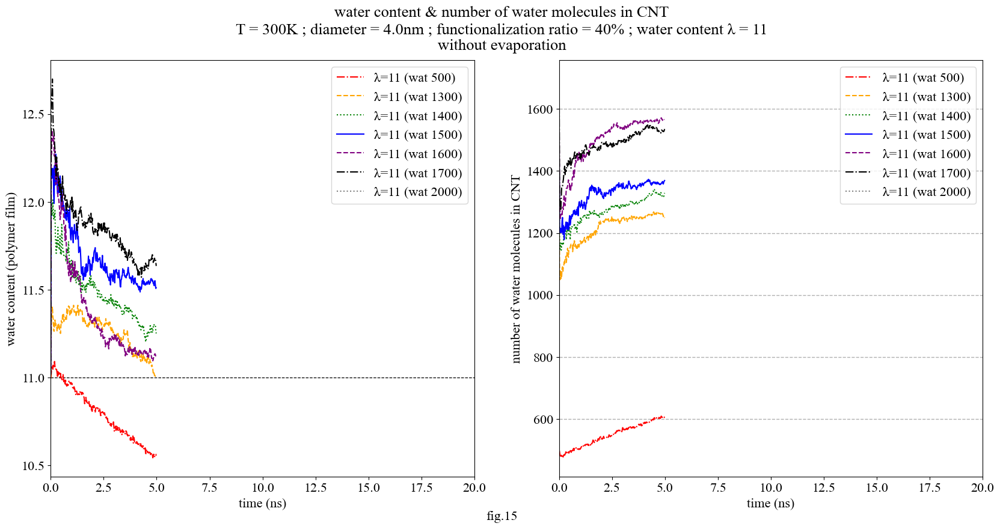

<< T=300; diameter=4.0nm, coh=50, λ = 3 >>
df_Ow_nt30_coh25_nafl7_t300_wat600 [number (oxonium ions above)]: Empty DataFrame
df_Ow_nt30_coh25_nafl3_t300_wat600 [number (water molecules in CNT)]: Empty DataFrame
Key Error with df_Ow_nt30_coh25_nafl3_t300_wat700 [number (water molecules above)]: Empty DataFrame

df_Ow_nt30_coh25_nafl7_t300_wat700 [number (oxonium ions above)]: Empty DataFrame
df_Ow_nt30_coh25_nafl3_t300_wat700 [number (water molecules in CNT)]: Empty DataFrame
16


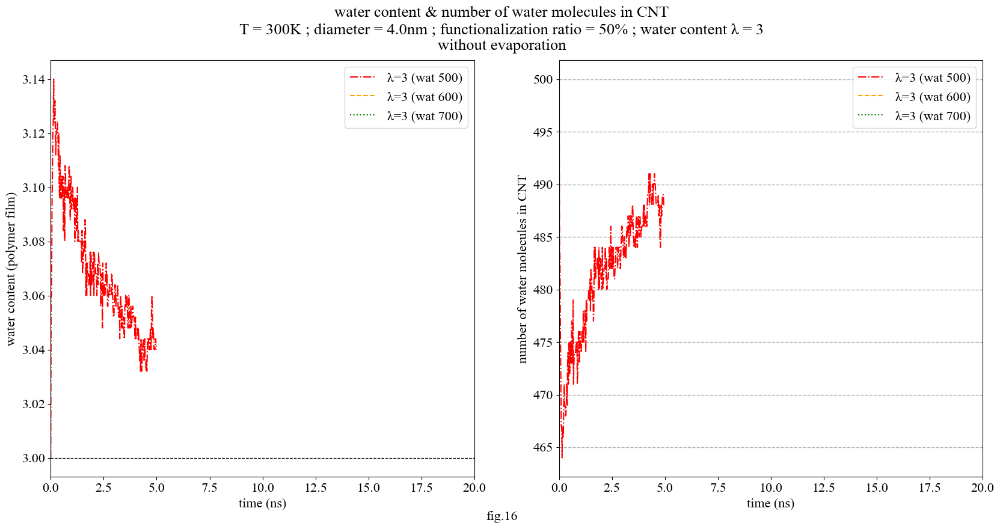

<< T=300; diameter=4.0nm, coh=50, λ = 7 >>
17


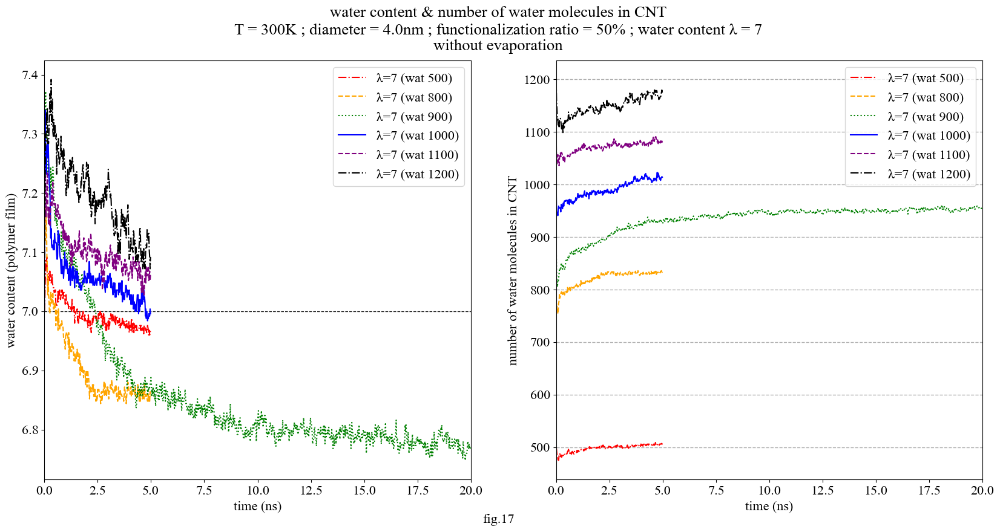

<< T=300; diameter=4.0nm, coh=50, λ = 11 >>
18


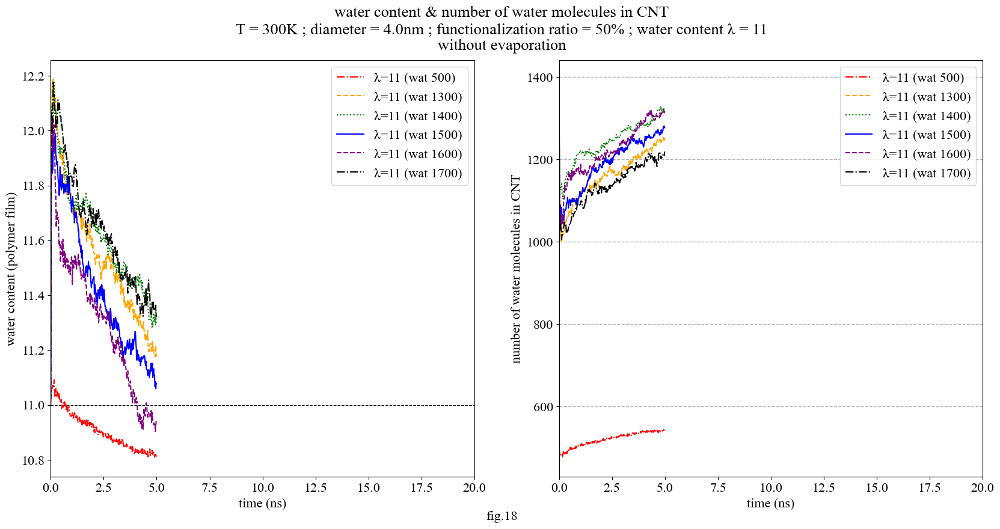

<< T=350; diameter=2.7nm, coh=30, λ = 3 >>
Key Error with df_Ow_nt20_coh15_nafl3_t350_wat400 [number (water molecules above)]: Empty DataFrame

df_Ow_nt20_coh15_nafl3_t350_wat400 [number (oxonium ions above)]: Empty DataFrame
df_Ow_nt20_coh15_nafl3_t350_wat400 [number (water molecules in CNT)]: Empty DataFrame
19


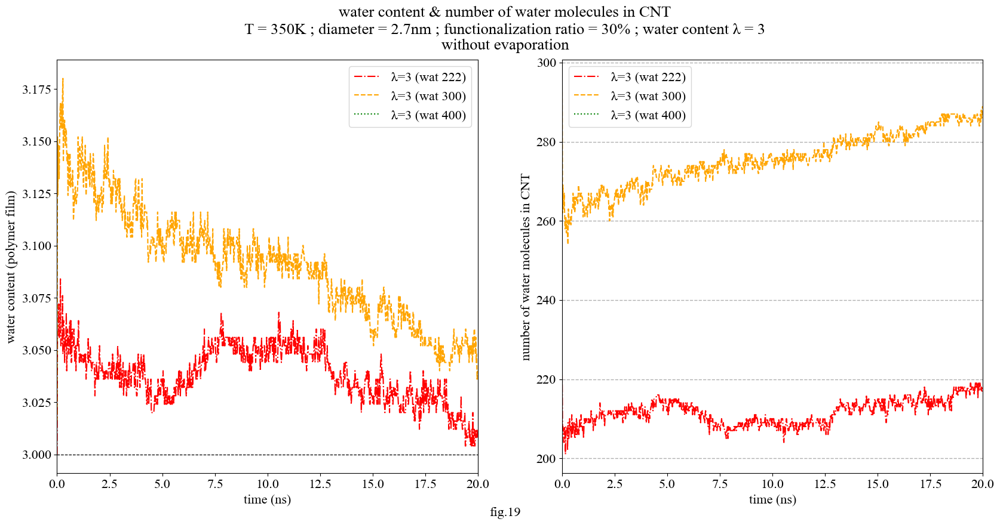

<< T=350; diameter=2.7nm, coh=30, λ = 7 >>
Key Error with df_Ow_nt20_coh15_nafl7_t350_wat222 [number (water molecules above)]: Empty DataFrame

df_Ow_nt20_coh15_nafl3_t350_wat222 [number (oxonium ions above)]: Empty DataFrame
Key Error with df_Ow_nt20_coh15_nafl7_t350_wat550 [number (water molecules above)]: Empty DataFrame

df_Ow_nt20_coh15_nafl3_t350_wat550 [number (oxonium ions above)]: Empty DataFrame
df_Ow_nt20_coh15_nafl7_t350_wat550 [number (water molecules in CNT)]: Empty DataFrame
Key Error with df_Ow_nt20_coh15_nafl7_t350_wat800 [number (water molecules above)]: Empty DataFrame

df_Ow_nt20_coh15_nafl3_t350_wat800 [number (oxonium ions above)]: Empty DataFrame
df_Ow_nt20_coh15_nafl7_t350_wat800 [number (water molecules in CNT)]: Empty DataFrame
20


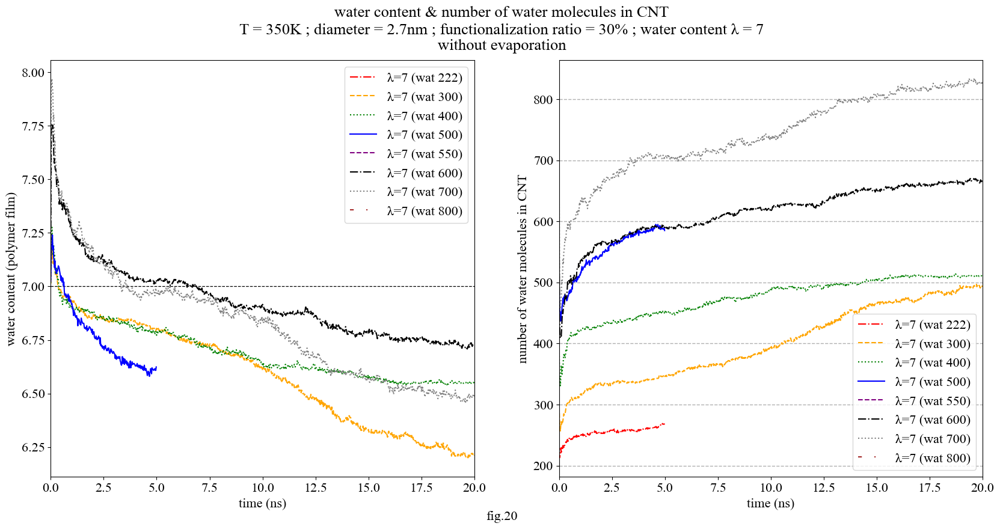

<< T=350; diameter=2.7nm, coh=30, λ = 11 >>
21


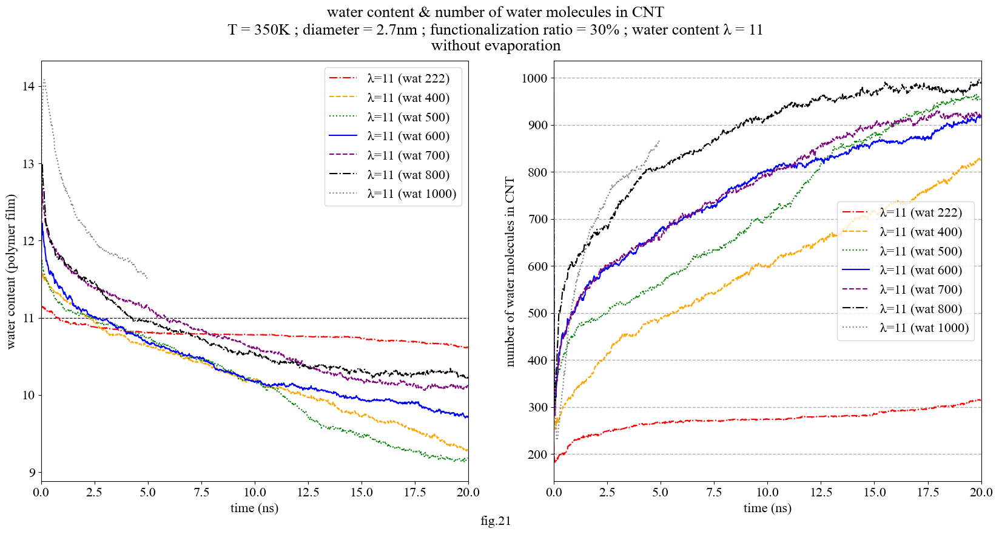

<< T=350; diameter=2.7nm, coh=40, λ = 3 >>
22


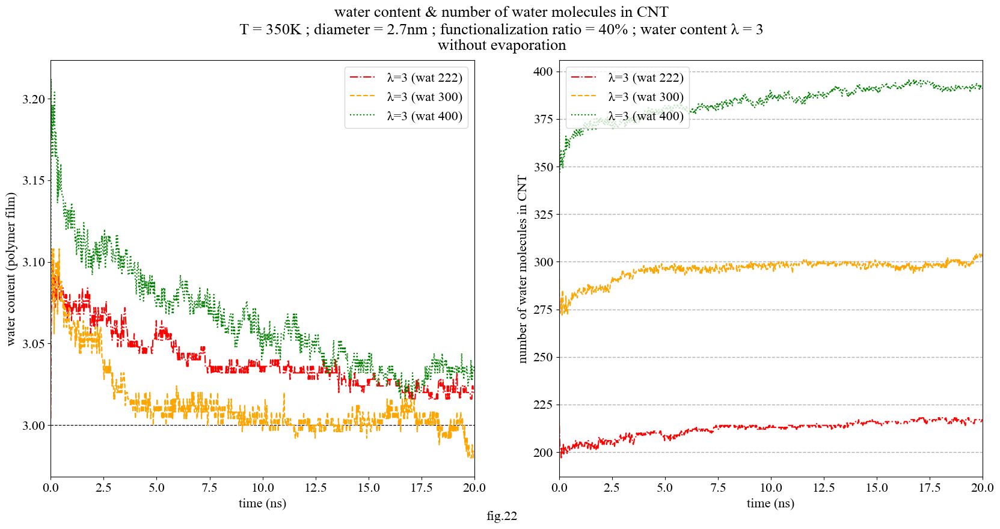

<< T=350; diameter=2.7nm, coh=40, λ = 7 >>
23


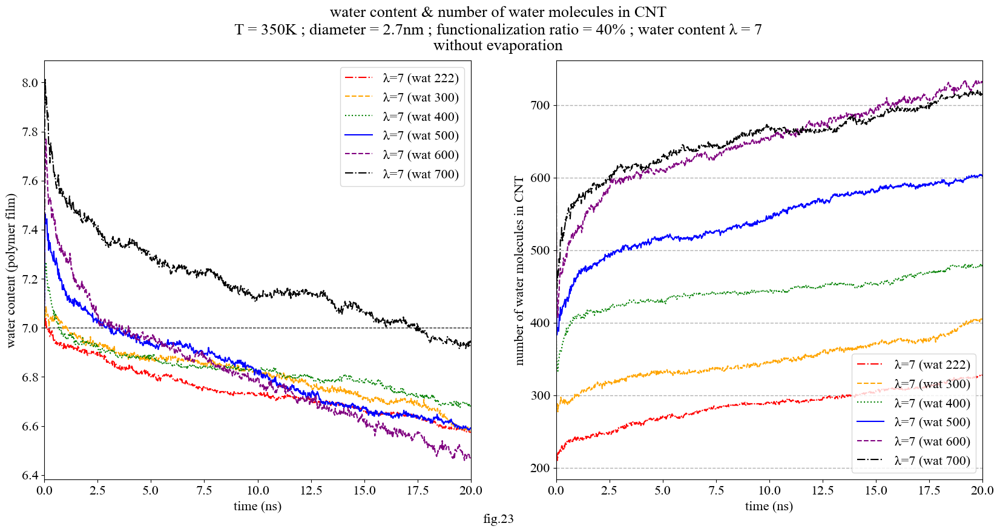

<< T=350; diameter=2.7nm, coh=40, λ = 11 >>
24


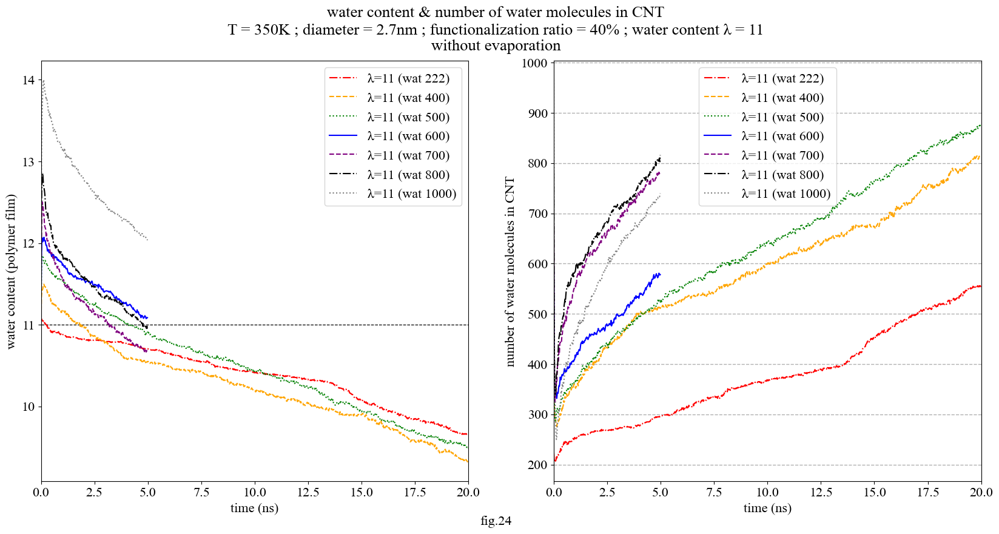

<< T=350; diameter=2.7nm, coh=50, λ = 3 >>
df_Ow_nt20_coh25_nafl3_t350_wat300 [number (oxonium ions above)]: Empty DataFrame
df_Ow_nt20_coh25_nafl3_t350_wat300 [number (water molecules in CNT)]: Empty DataFrame
25


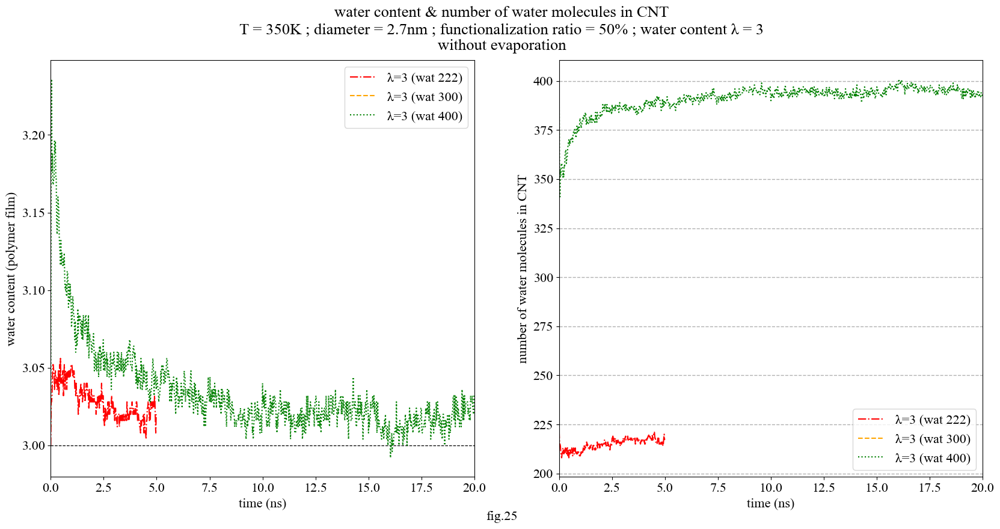

<< T=350; diameter=2.7nm, coh=50, λ = 7 >>
26


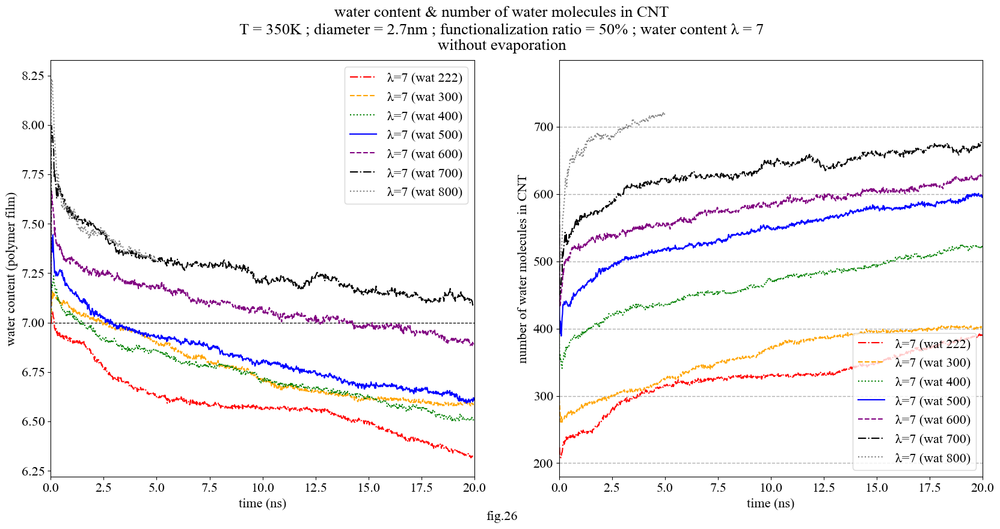

<< T=350; diameter=2.7nm, coh=50, λ = 11 >>
Key Error with df_Ow_nt20_coh25_nafl11_t350_wat1000 [number (water molecules above)]: Empty DataFrame

df_Ow_nt20_coh25_nafl3_t350_wat1000 [number (oxonium ions above)]: Empty DataFrame
df_Ow_nt20_coh25_nafl11_t350_wat1000 [number (water molecules in CNT)]: Empty DataFrame
27


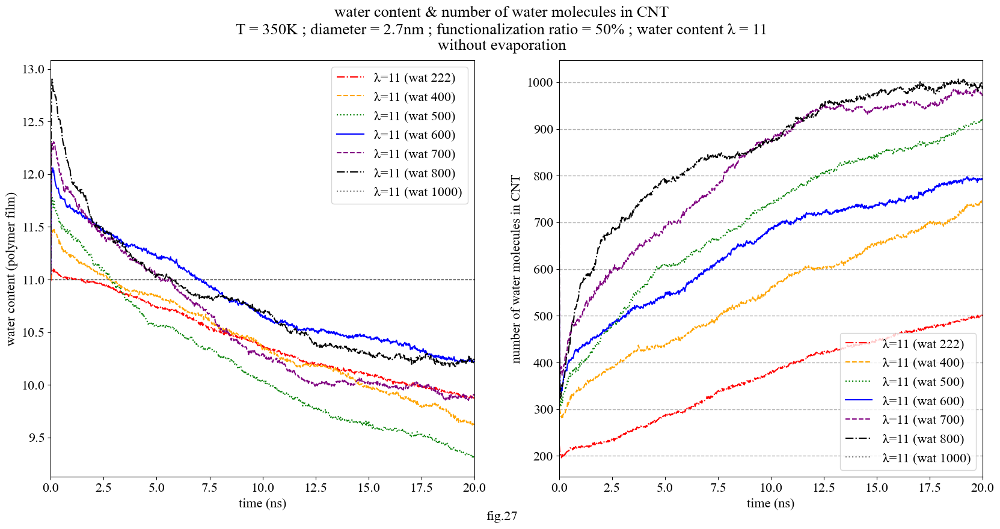

<< T=350; diameter=4.0nm, coh=30, λ = 3 >>
Key Error with df_Ow_nt30_coh15_nafl3_t350_wat600 [number (water molecules above)]: Empty DataFrame

df_Ow_nt30_coh15_nafl7_t350_wat600 [number (oxonium ions above)]: Empty DataFrame
df_Ow_nt30_coh15_nafl3_t350_wat600 [number (water molecules in CNT)]: Empty DataFrame
Key Error with df_Ow_nt30_coh15_nafl3_t350_wat700 [number (water molecules above)]: Empty DataFrame

df_Ow_nt30_coh15_nafl7_t350_wat700 [number (oxonium ions above)]: Empty DataFrame
df_Ow_nt30_coh15_nafl3_t350_wat700 [number (water molecules in CNT)]: Empty DataFrame
28


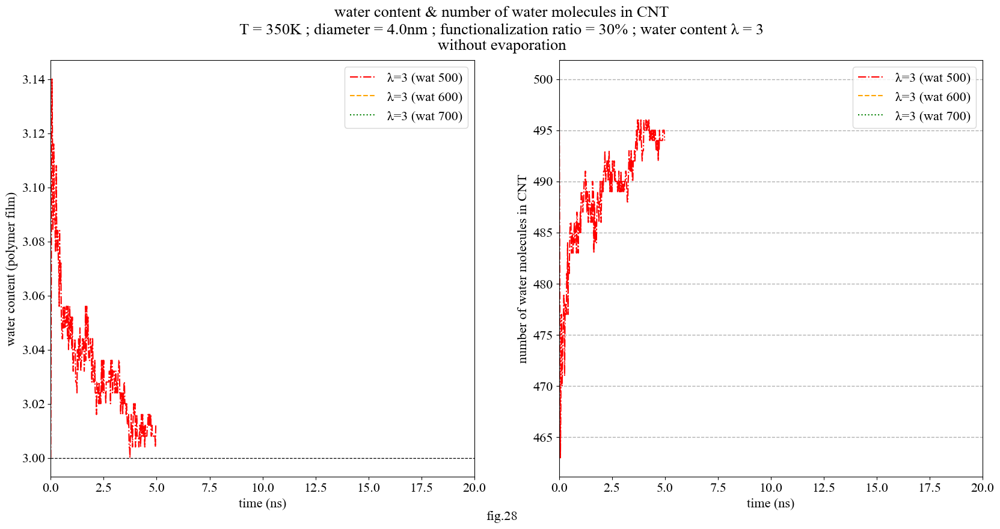

<< T=350; diameter=4.0nm, coh=30, λ = 7 >>
Key Error with df_Ow_nt30_coh15_nafl7_t350_wat1300 [number (water molecules above)]: Empty DataFrame

df_Ow_nt30_coh15_nafl7_t350_wat1300 [number (oxonium ions above)]: Empty DataFrame
df_Ow_nt30_coh15_nafl7_t350_wat1300 [number (water molecules in CNT)]: Empty DataFrame
29


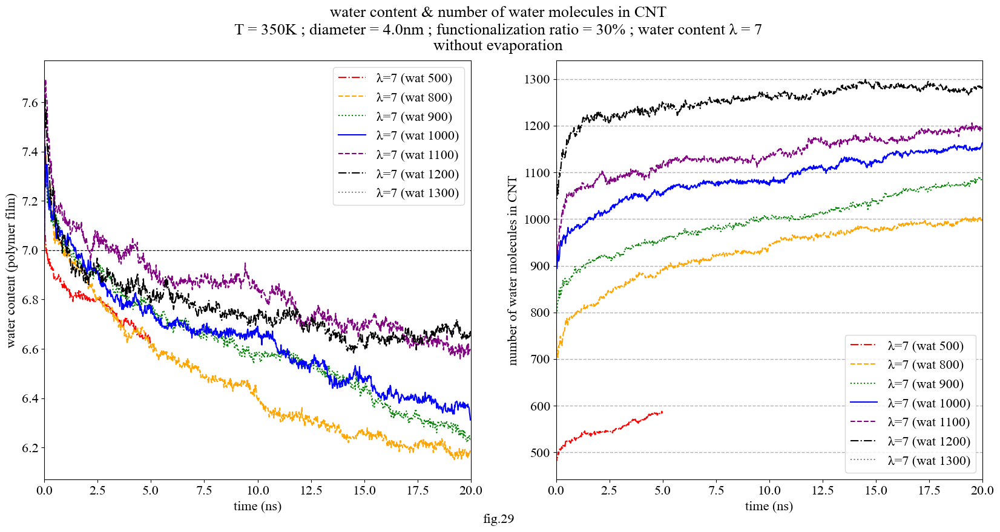

<< T=350; diameter=4.0nm, coh=30, λ = 11 >>
Key Error with df_Ow_nt30_coh15_nafl11_t350_wat2000 [number (water molecules above)]: Empty DataFrame

df_Ow_nt30_coh15_nafl7_t350_wat2000 [number (oxonium ions above)]: Empty DataFrame
df_Ow_nt30_coh15_nafl11_t350_wat2000 [number (water molecules in CNT)]: Empty DataFrame
30


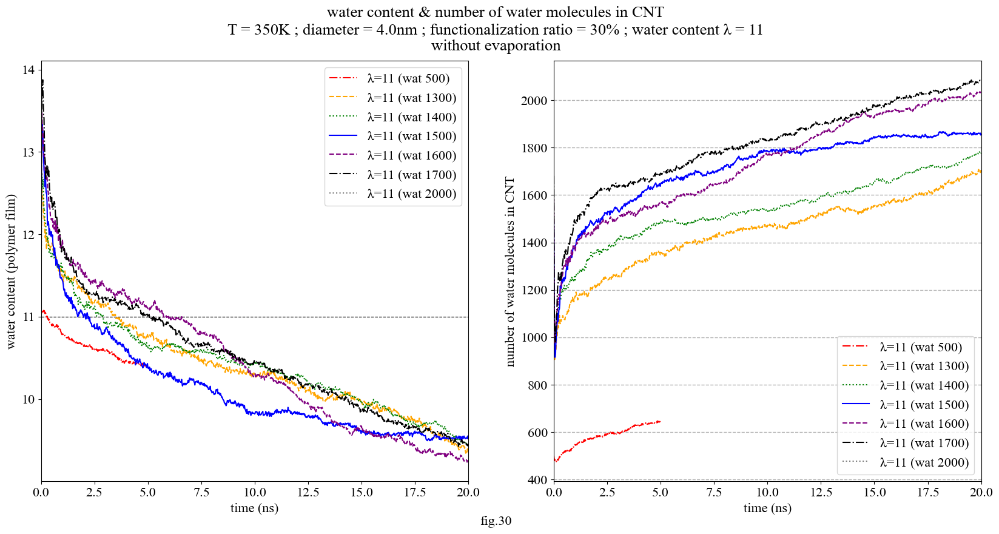

<< T=350; diameter=4.0nm, coh=40, λ = 3 >>
Key Error with df_Ow_nt30_coh20_nafl3_t350_wat600 [number (water molecules above)]: Empty DataFrame

df_Ow_nt30_coh20_nafl7_t350_wat600 [number (oxonium ions above)]: Empty DataFrame
df_Ow_nt30_coh20_nafl3_t350_wat600 [number (water molecules in CNT)]: Empty DataFrame
Key Error with df_Ow_nt30_coh20_nafl3_t350_wat700 [number (water molecules above)]: Empty DataFrame

df_Ow_nt30_coh20_nafl7_t350_wat700 [number (oxonium ions above)]: Empty DataFrame
df_Ow_nt30_coh20_nafl3_t350_wat700 [number (water molecules in CNT)]: Empty DataFrame
31


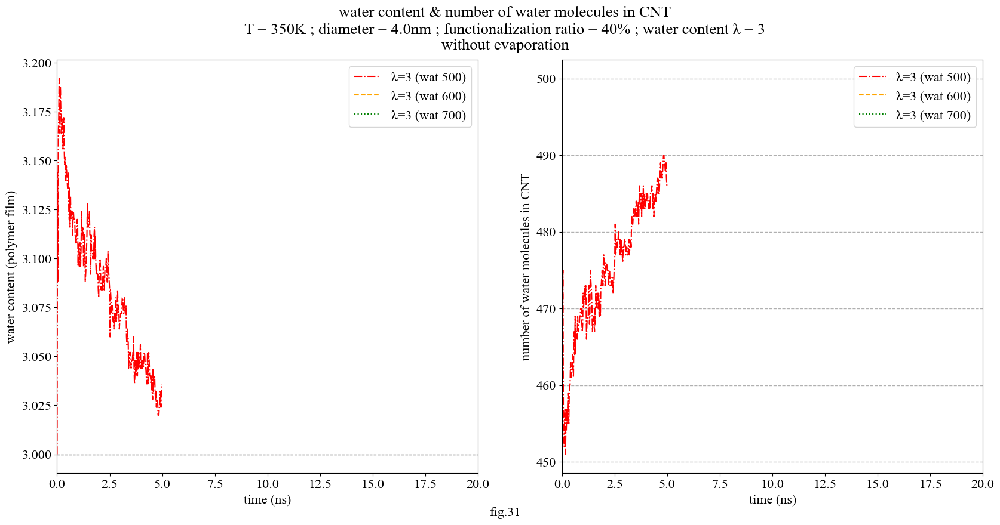

<< T=350; diameter=4.0nm, coh=40, λ = 7 >>
32


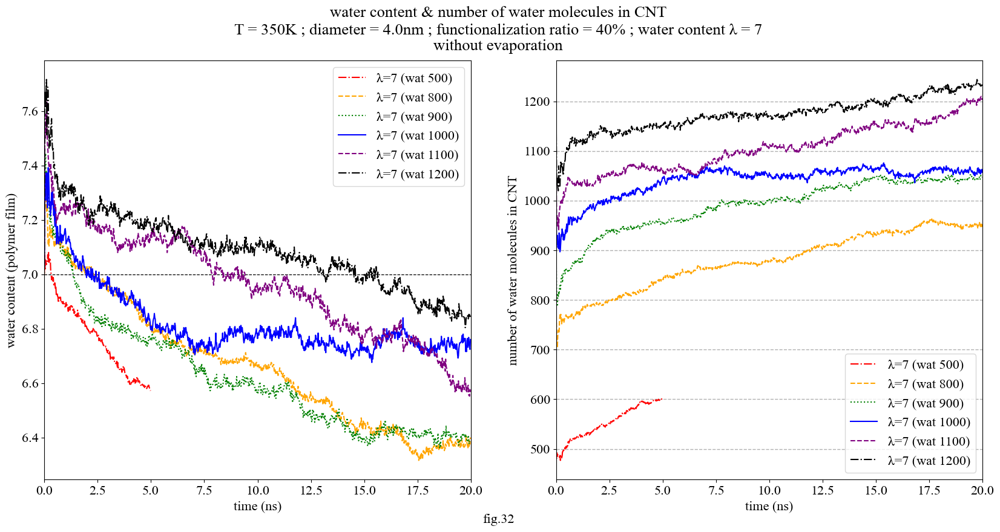

<< T=350; diameter=4.0nm, coh=40, λ = 11 >>
Key Error with df_Ow_nt30_coh20_nafl11_t350_wat2300 [number (water molecules above)]: Empty DataFrame

df_Ow_nt30_coh20_nafl7_t350_wat2300 [number (oxonium ions above)]: Empty DataFrame
df_Ow_nt30_coh20_nafl11_t350_wat2300 [number (water molecules in CNT)]: Empty DataFrame
33


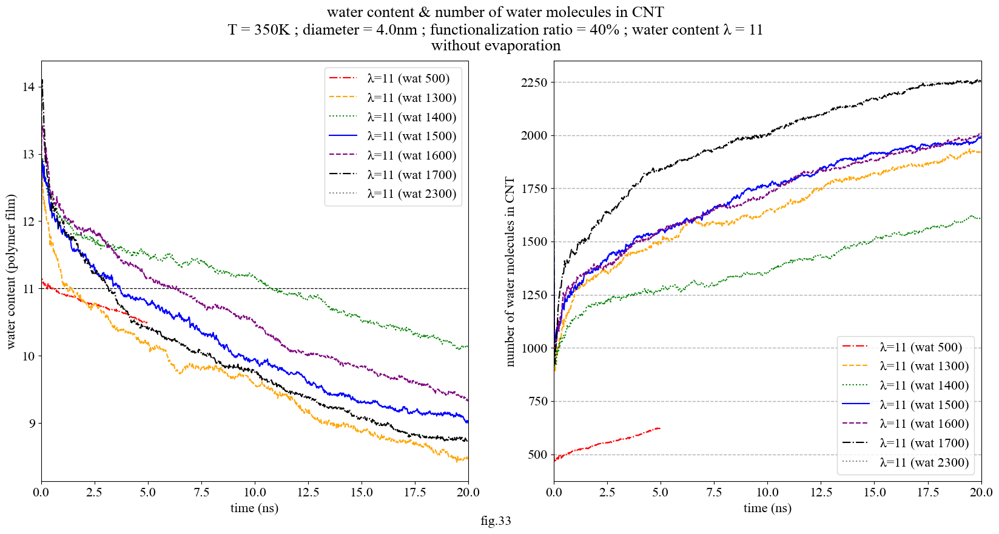

<< T=350; diameter=4.0nm, coh=50, λ = 3 >>
Key Error with df_Ow_nt30_coh25_nafl3_t350_wat600 [number (water molecules above)]: Empty DataFrame

df_Ow_nt30_coh25_nafl7_t350_wat600 [number (oxonium ions above)]: Empty DataFrame
df_Ow_nt30_coh25_nafl3_t350_wat600 [number (water molecules in CNT)]: Empty DataFrame
Key Error with df_Ow_nt30_coh25_nafl3_t350_wat700 [number (water molecules above)]: Empty DataFrame

df_Ow_nt30_coh25_nafl7_t350_wat700 [number (oxonium ions above)]: Empty DataFrame
df_Ow_nt30_coh25_nafl3_t350_wat700 [number (water molecules in CNT)]: Empty DataFrame
34


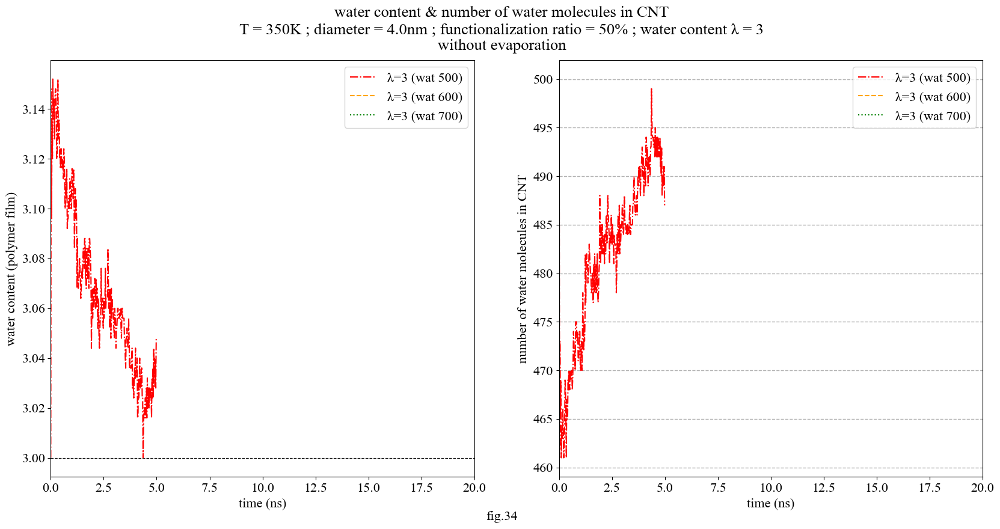

<< T=350; diameter=4.0nm, coh=50, λ = 7 >>
35


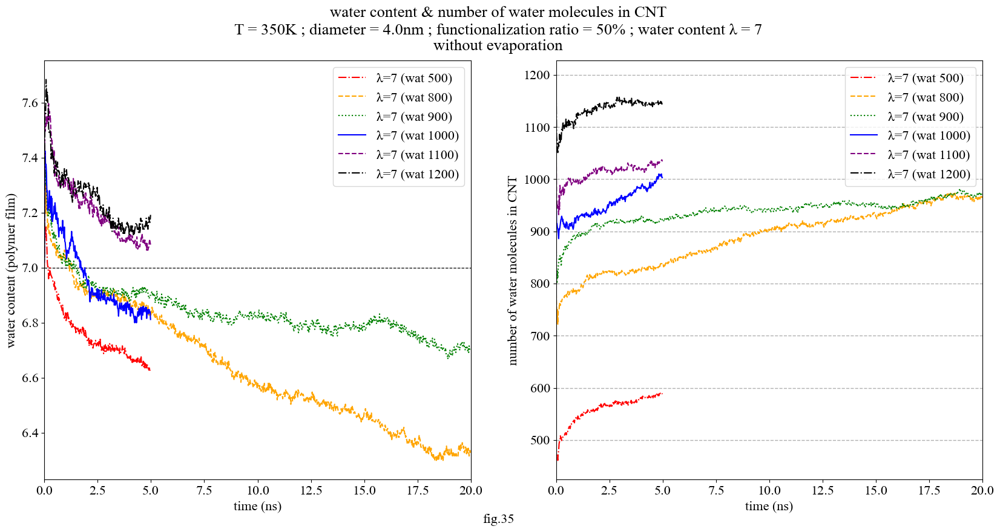

<< T=350; diameter=4.0nm, coh=50, λ = 11 >>
Key Error with df_Ow_nt30_coh25_nafl11_t350_wat2300 [number (water molecules above)]: Empty DataFrame

df_Ow_nt30_coh25_nafl7_t350_wat2300 [number (oxonium ions above)]: Empty DataFrame
df_Ow_nt30_coh25_nafl11_t350_wat2300 [number (water molecules in CNT)]: Empty DataFrame
36


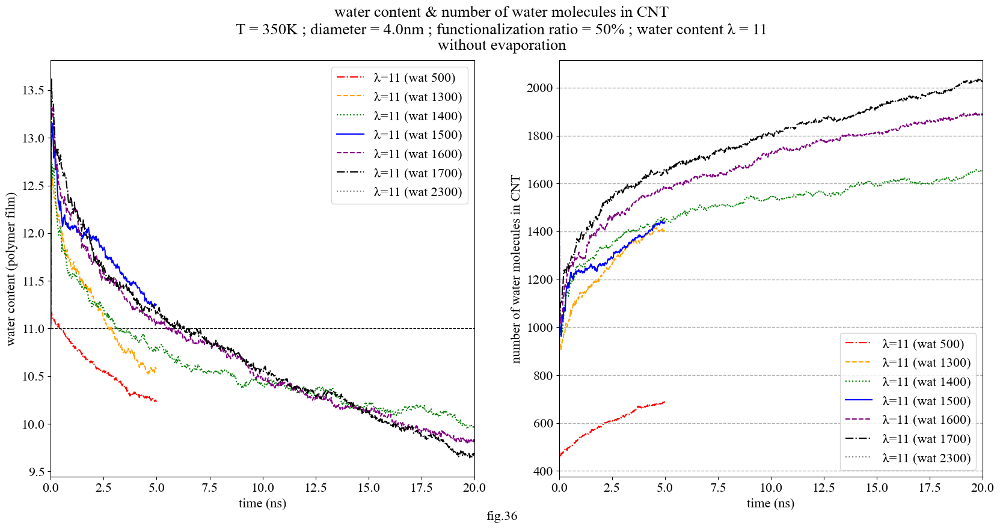

In [10]:
def wc_and_num_all():
    count = 1
    for t in range(len(temps)):
        for n in range(len(nts)):
            for c in range(len(cohs)): 
                for naf in range(len(nafls)):

                    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20,9))
                    fig.suptitle(f"water content & number of water molecules in CNT\nT = {temps[t]}K ; diameter = {Diameter[n]} ; functionalization ratio = {cohs[c]*2}% ; water content λ = {nafls[naf]}\nwithout evaporation\n\n")
                    fig.text(0.5, 0.03, f'fig.{count}', ha='center')
                    print(f"<< T={temps[t]}; diameter={Diameter[n]}, coh={cohs[c]*2}, λ = {nafls[naf]} >>")
                    
                    match nafls[naf]:
                        case 3:
                            fig.axes[0].axhline(y = 3,  color = 'Black', linestyle = '--', linewidth = 0.9)
                        case 7:
                            fig.axes[0].axhline(y = 7,  color = 'Black', linestyle = '--', linewidth = 0.9)
                        case 11:
                            fig.axes[0].axhline(y = 11, color = 'Black', linestyle = '--', linewidth = 0.9)

                    Y = [ [] for _ in range(2) ]  
                    
                    match (naf, n):
                        case (0, 0):
                            wats = wats03_nt20 
                        case (1, 0):
                            wats = wats07_nt20 
                        case (2, 0):
                            wats = wats11_nt20 
                        case (0, 1):
                            wats = wats03_nt30
                        case (1, 1):
                            wats = wats07_nt30
                        case (2, 1):
                            wats = wats11_nt30
                    
                    match (t, naf, n, c):
                        case(1, 1, 0, 0):
                            wats = wats.copy()
                            wats.append(550)
                            wats.append(800)
                            wats.sort()

 
                        case(0, 1, 1, 0):
                            wats = wats.copy()
                            wats.append(1300)

                            wats.append(1400)
                            wats.sort()

                        case(0, 1, 0, 1):
                            wats = wats.copy()
                            wats.append(450)
                            wats.sort()

                    # match (t, naf, n, c):
                    #     case(1, 1, 0, 0):
                    #         wats = wats.copy()
                            
                    #         wats.sort()

                        case(1, 2, 0, 0):
                            wats = wats.copy()
                            wats.append(1000)
                            wats.sort()


                        case(1, 2, 0, 1):
                            wats = wats.copy()
                            wats.append(1000)
                            wats.sort()

                        case(1, 1, 0, 2):
                            wats = wats.copy()
                            wats.append(800)
                            wats.sort()

  
                        case(1, 2, 0, 2):
                            wats = wats.copy()
                            wats.append(1000)
                            wats.sort()

                        case(1, 1, 1, 0):
                            wats = wats.copy()
                            wats.append(1300)
                            wats.sort()

                        case(1, 2, 1, 0):
                            wats = wats.copy()
                            wats.append(2000)
                            wats.sort()

                        case(1, 2, 1, 1):
                            wats = wats.copy()
                            wats.append(2300)
                            wats.sort()

                        case(1, 2, 1, 2):
                            wats = wats.copy()
                            wats.append(2300)
                            wats.sort()

                        case(0, 2, 1, 1):
                            wats = wats.copy()
                            wats.append(2000)
                            wats.sort()

                    for w in range(len(wats)):
                
                        try:
                            num_Ow_above_tube = dicts_list[0][f"df_Ow_nt{nts[n]}_coh{cohs[c]}_nafl{nafls[naf]}_t{temps[t]}_wat{wats[w]}"]['number (water molecules)']
                            if num_Ow_above_tube.empty:
                                print(f"Key Error with df_Ow_nt{nts[n]}_coh{cohs[c]}_nafl{nafls[naf]}_t{temps[t]}_wat{wats[w]} [number (water molecules above)]: Empty DataFrame\n")
                                # continue
                        except KeyError:
                                continue
###########################################
                        try: 
                            num_Oh_above_tube = dicts_list[1][f"df_Ow_nt{nts[n]}_coh{cohs[c]}_nafl{nafls[naf]}_t{temps[t]}_wat{wats[w]}"]['number (oxonium ions)']
                            if num_Oh_above_tube.empty:
                                print(f"df_Ow_nt{nts[n]}_coh{cohs[c]}_nafl{nafls[n]}_t{temps[t]}_wat{wats[w]} [number (oxonium ions above)]: Empty DataFrame")
                                # continue
                        except KeyError:
                                continue

########################################
                        try:
                            num_Ow_in_tube =    dicts_list[2][f"df_Ow_nt{nts[n]}_coh{cohs[c]}_nafl{nafls[naf]}_t{temps[t]}_wat{wats[w]}"]['number (water molecules)']
                            if num_Ow_in_tube.empty:
                                print(f"df_Ow_nt{nts[n]}_coh{cohs[c]}_nafl{nafls[naf]}_t{temps[t]}_wat{wats[w]} [number (water molecules in CNT)]: Empty DataFrame")
                                # continue
                        except KeyError:
                                continue
                                #  continue
##########################################

                        Y[0].append( (num_Ow_above_tube + num_Oh_above_tube) / 250 )
                        Y[1].append( num_Ow_in_tube )

                    for w in range(len(wats)):
                        try:
                            # X_sampled = X[::sample_rate]
                            Y_sampled = Y[0][w][::sample_rate]
                            X = Y[0][w].index / 1000
                            X_sampled = X[::sample_rate]
                            axes[0].plot(X_sampled, Y_sampled, color=colors[w], linestyle=line_styles[w],label=f"λ={nafls[naf]} (wat {wats[w]})")
                        except IndexError:
                            paolo=f"\"{grandparent_dir}/COHCH_gra_t{temps[t]}_EVAPOR/nt{nts[n]}-coh{cohs[c]}-nafl{nafls[naf]}-t{temps[t]}-wat{wats[w]}\""
                            scp  =f"\"/work/B/NIa/NIa078/COHCH_gra_t{temps[t]}_EVAPOR/nt{nts[n]}-coh{cohs[c]}-nafl{nafls[naf]}-t{temps[t]}-wat{wats[w]}/output_analysis\""
                            # print(f"Index error with {paolo}")
                            # print(f"Index error with {scp}")
                            
                            # print(f"scp -r {scp} jihun@paolo000:{paolo}")
                            # print("")
                            continue

                        try:
                            X_sampled = X[::sample_rate]
                            Y_sampled = Y[1][w][::sample_rate]
                            X = Y[1][w].index / 1000
                            X_sampled = X[::sample_rate]
                            axes[1].plot(X_sampled, Y_sampled, color=colors[w], linestyle=line_styles[w],label=f"λ={nafls[naf]} (wat {wats[w]})")
                        except IndexError:
                            paolo=f"\"{grandparent_dir}/COHCH_gra_t{temps[t]}_EVAPOR/nt{nts[n]}-coh{cohs[c]}-nafl{nafls[naf]}-t{temps[t]}-wat{wats[w]}\""
                            scp  =f"\"/work/B/NIa/NIa078/COHCH_gra_t{temps[t]}_EVAPOR/nt{nts[n]}-coh{cohs[c]}-nafl{nafls[naf]}-t{temps[t]}-wat{wats[w]}/output_analysis\""
                            # print(f"Index error with {paolo}")
                            # print(f"Index error with {scp}")
                            
                            # print(f"scp -r {scp} jihun@paolo000:{paolo}")
                            # print("")
                            continue
##############################################################################                        
                    fig.axes[0].set_xlim((0,20))
                    fig.axes[0].legend()
                    fig.axes[0].set_xlabel('time (ns)')
                    fig.axes[0].set_ylabel('water content (polymer film)')

                    fig.axes[1].set_xlim((0,20))
                    fig.axes[1].legend()
                    fig.axes[1].set_xlabel('time (ns)')
                    fig.axes[1].set_ylabel('number of water molecules in CNT')
                    fig.axes[1].grid(axis='y',linestyle='dashed', linewidth=1)        
                    

                    plt.rcParams["font.family"] = "serif"
                    plt.rcParams["font.serif"] = ["Times New Roman"]
                    
                    matplotlib.rcParams.update({'font.size': 16})

                    print(count)
                    plt.show()
                    count = count+1

if __name__ == "__main__":
    Diameter = ("2.7nm", "4.0nm")
    nafls = (3, 7, 11) # CAUTION
    colors = ["Red","Orange","Green","Blue","Purple","Black","gray", "brown"]
    line_styles = ['-.', '--', ':', 'solid', 'dashed', 'dashdot', 'dotted', (0, (3, 10, 1, 10, 1, 10)),'loosely dashdotdotted']


    sample_rate = 20
    wc_and_num_all()

In [11]:
print(DataFrame_dict_Oh_in_tube)

{'df_Ow_nt20_coh15_nafl3_t300_wat222':        time (ns)  number (oxonium ions)
0          0.001                      0
1          0.002                      0
2          0.003                      0
3          0.004                      0
4          0.005                      0
...          ...                    ...
19995     19.996                      0
19996     19.997                      0
19997     19.998                      0
19998     19.999                      0
19999     20.000                      0

[20000 rows x 2 columns], 'df_Ow_nt20_coh15_nafl3_t300_wat300':        time (ns)  number (oxonium ions)
0          0.001                      0
1          0.002                      0
2          0.003                      0
3          0.004                      0
4          0.005                      0
...          ...                    ...
19995     19.996                      1
19996     19.997                      1
19997     19.998                      0
19998     19.999